In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyspark

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.8/310.8 MB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.4.1-py2.py3-none-any.whl size=311285398 sha256=0bdf5ff3ded6e99820ae46f115cf7131e49dad4968f45ffb272b2a260134c4be
  Stored in directory: /root/.cache/pip/wheels/0d/77/a3/ff2f74cc9ab41f8f594dabf0579c2a7c6de920d584206e0834
Successfully built pyspark


In [ ]:
!pip install findspark

In [ ]:
import findspark
findspark.init()
import pyspark # only run after findspark.init()
from pyspark.sql import SparkSession
spark = SparkSession.builder.getOrCreate()

In [ ]:
from pyspark.conf import SparkConf
SparkSession.builder.config(conf=SparkConf())

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

In [ ]:
from pyspark.sql import *
from pyspark.sql.functions import desc,sum,col
#Create DataFrame
df = spark.read.csv(r"/content/drive/MyDrive/Datasets/Suicides in India 2001-2012.csv", inferSchema = True, header = True)
data = pd.read_csv("/content/drive/MyDrive/Datasets/Suicides in India 2001-2012.csv")

In [ ]:
df.show()

+-------------+----+---------+--------------------+------+---------+-----+
|        State|Year|Type_code|                Type|Gender|Age_group|Total|
+-------------+----+---------+--------------------+------+---------+-----+
|A & N Islands|2001|   Causes|  Illness (Aids/STD)|Female|     0-14|    0|
|A & N Islands|2001|   Causes|Bankruptcy or Sud...|Female|     0-14|    0|
|A & N Islands|2001|   Causes|Cancellation/Non-...|Female|     0-14|    0|
|A & N Islands|2001|   Causes|Physical Abuse (R...|Female|     0-14|    0|
|A & N Islands|2001|   Causes|       Dowry Dispute|Female|     0-14|    0|
|A & N Islands|2001|   Causes|     Family Problems|Female|     0-14|    0|
|A & N Islands|2001|   Causes|Ideological Cause...|Female|     0-14|    0|
|A & N Islands|2001|   Causes|Other Prolonged I...|Female|     0-14|    0|
|A & N Islands|2001|   Causes|    Property Dispute|Female|     0-14|    0|
|A & N Islands|2001|   Causes|Fall in Social Re...|Female|     0-14|    0|
|A & N Islands|2001|   Ca

In [ ]:
data.shape

(237519, 7)

**Finding NULL values**

In [ ]:
data.isnull().sum()

State        0
Year         0
Type_code    0
Type         0
Gender       0
Age_group    0
Total        0
dtype: int64

**Number of suicides per year**

In [ ]:
df.groupBy("Year").agg(sum('Total').alias('suicides')).show()

+----+--------+
|Year|suicides|
+----+--------+
|2003|  997622|
|2007| 1103667|
|2006| 1062991|
|2004| 1023137|
|2012| 1189068|
|2009| 1144033|
|2001|  976464|
|2005| 1025201|
|2010| 1211322|
|2011| 1219499|
|2008| 1125082|
|2002|  993648|
+----+--------+



<ipython-input-17-6f5a17463652>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tot_suicide = causes.groupby('Year').sum()


<Axes: title={'center': 'Number of Suicides each Year From 2001 - 12'}, xlabel='Year', ylabel='Total Suicides'>

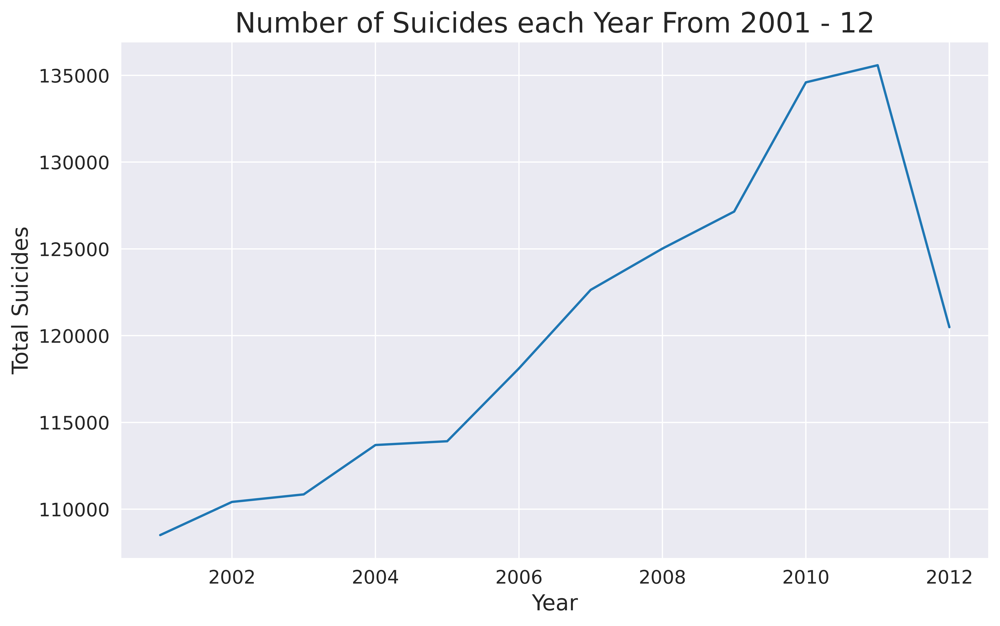

In [ ]:
causes = data[data['Type_code'] == 'Causes']
tot_suicide = causes.groupby('Year').sum()
sns.set_style(style = 'darkgrid')
plt.figure(figsize = (10,6), dpi = 720)
plt.title("Number of Suicides each Year From 2001 - 12", fontsize = 18)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.ylabel('Total Suicides', fontsize = 14)
plt.xlabel('Year', fontsize = 14)
sns.lineplot(x = 'Year', y = 'Total', data = tot_suicide)

**Number of suicides per each cause**

In [ ]:
df.groupBy("Type").agg(sum('Total').alias('suicides')).show()

+--------------------+--------+
|                Type|suicides|
+--------------------+--------+
|Fall in Social Re...|   13464|
|By touching elect...|   10816|
|       Never Married|  954903|
|    Property Dispute|   18652|
|        No Education|  965271|
|By coming under r...|   45299|
|By Overdose of sl...|    9960|
|Farming/Agricultu...|  197923|
|             Student|   74323|
|     Family Problems|  341952|
|Other Causes (Ple...|  216050|
|             Divorce|    4133|
|Illegitimate Preg...|    2494|
|        By Fire-Arms|    6294|
|Others (Please Sp...|  469147|
|              Middle| 1028913|
|By Consuming Othe...|  231178|
|By Jumping from (...|    7871|
|Post Graduate and...|   22425|
|Failure in Examin...|   27005|
+--------------------+--------+
only showing top 20 rows



**suicides by gender**

In [ ]:
df.groupBy("Gender").agg(sum('Total').alias('suicides')).show()

+------+--------+
|Gender|suicides|
+------+--------+
|Female| 4702974|
|  Male| 8368760|
+------+--------+



   Gender    Total
0  Female  4702974
1    Male  8368760


<ipython-input-20-5c995c455ffb>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  filter_gender = data.groupby('Gender', as_index=False).sum()[['Gender', 'Total']]


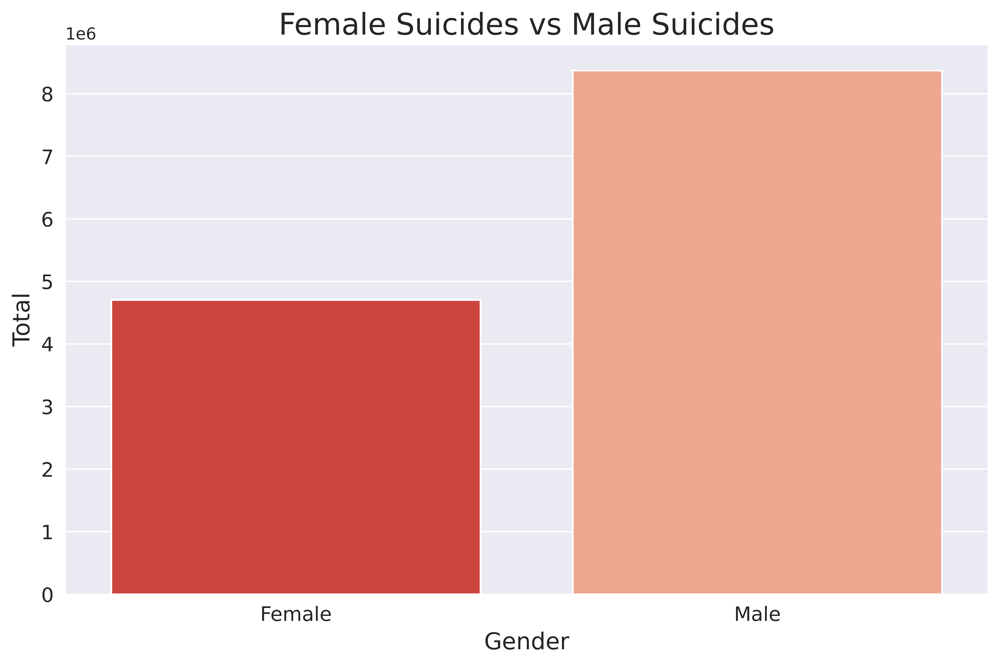

In [ ]:
filter_gender = data.groupby('Gender', as_index=False).sum()[['Gender', 'Total']]
print(filter_gender)
plt.figure(figsize=(10,6), dpi=720)
c1 = sns.barplot(x='Gender', y='Total', data=filter_gender, palette='Reds_r')
plt.title("Female Suicides vs Male Suicides", fontsize=18)
plt.ylabel("Total", fontsize=14)
plt.yticks(fontsize=12)
plt.xlabel("Gender", fontsize=14)
plt.xticks(fontsize=12)
plt.show()

**Number of suicides divided based on age groups**

In [ ]:
df.groupBy("Age_group").agg(sum('Total').alias('suicides')).show()

+---------+--------+
|Age_group|suicides|
+---------+--------+
|    15-29| 1534037|
|   0-100+| 8735586|
|      60+|  346925|
|     0-14|   98410|
|    30-44| 1471599|
|    45-59|  885177|
+---------+--------+



**Number of suicides divided overall Indian states**

In [ ]:
df.groupBy("State").agg(sum('Total').alias('suicides')).show()

+-----------------+--------+
|            State|suicides|
+-----------------+--------+
|        Karnataka|  734825|
|           Kerala|  538946|
|     Chhattisgarh|  302354|
|   Andhra Pradesh|  814059|
|      Lakshadweep|      50|
|   Madhya Pradesh|  451535|
|          Manipur|    2102|
|      Daman & Diu|    1391|
|  Jammu & Kashmir|   14821|
|              Goa|   17363|
| Himachal Pradesh|   26562|
|          Haryana|  147176|
|        Jharkhand|   49720|
|Arunachal Pradesh|    6633|
|          Gujarat|  330858|
|       Delhi (Ut)|   84272|
|       Chandigarh|    5164|
|            Assam|  172276|
|        Meghalaya|    5415|
|      Maharashtra|  901945|
+-----------------+--------+
only showing top 20 rows



<ipython-input-23-d7b4e92ac625>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  filter_state = data.groupby('State', as_index = False).sum()[['State','Total']].sort_values(by = 'Total', ascending = False).head(15)


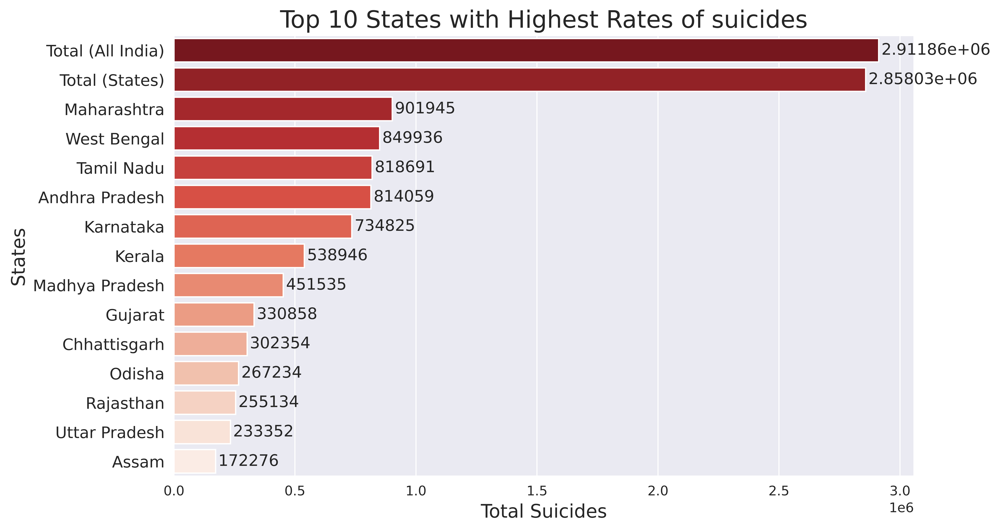

In [ ]:
filter_state = data.groupby('State', as_index = False).sum()[['State','Total']].sort_values(by = 'Total', ascending = False).head(15)
plt.figure(figsize = (10,6), dpi = 720)
c1 = sns.barplot(x = 'Total', y = 'State', data = filter_state, palette = 'Reds_r')
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.title("Top 10 States with Highest Rates of suicides", fontsize = 18)
plt.ylabel("States", fontsize = 14)
plt.yticks(fontsize = 12)
plt.xlabel("Total Suicides", fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

In [ ]:
df.groupBy("Gender","Age_group").agg(sum('Total').alias('suicides')).show()

+------+---------+--------+
|Gender|Age_group|suicides|
+------+---------+--------+
|Female|     0-14|   49436|
|Female|   0-100+| 3144078|
|Female|    15-29|  701215|
|Female|      60+|   98242|
|  Male|   0-100+| 5591508|
|  Male|    30-44|  994138|
|Female|    30-44|  477461|
|  Male|    45-59|  652635|
|  Male|      60+|  248683|
|  Male|     0-14|   48974|
|Female|    45-59|  232542|
|  Male|    15-29|  832822|
+------+---------+--------+



In [ ]:
df.groupBy("Type_code").agg(sum('Total').alias('suicides')).show()

+--------------------+--------+
|           Type_code|suicides|
+--------------------+--------+
|    Education_Status| 4367793|
|Professional_Profile| 1439243|
|       Means_adopted| 1455931|
|       Social_Status| 4367793|
|              Causes| 1440974|
+--------------------+--------+



In [ ]:
df.groupBy("Gender","Type").agg(sum('Total').alias('suicides')).show()

+------+--------------------+--------+
|Gender|                Type|suicides|
+------+--------------------+--------+
|  Male|Bankruptcy or Sud...|   28878|
|  Male|             Student|   40931|
|  Male|By Jumping off Mo...|    6290|
|Female|Other Causes (Ple...|   71235|
|Female|By Consuming Othe...|   83638|
|Female|Service (Government)|    4231|
|Female|   Service (Private)|   18622|
|Female|     Widowed/Widower|   89787|
|  Male|Bankruptcy or Sud...|    2297|
|Female|             Student|   33392|
|Female|Suspected/Illicit...|    8093|
|  Male|Suspected/Illicit...|    6818|
|  Male|Professional Acti...|   35587|
|Female|Professional/Care...|    1596|
|Female|Self-employed (Bu...|    5789|
|  Male|By Jumping from (...|    5517|
|Female|Cancellation/Non-...|    6126|
|  Male|        Unemployment|   23617|
|  Male|             Diploma|   31257|
|  Male|             Divorce|    1598|
+------+--------------------+--------+
only showing top 20 rows



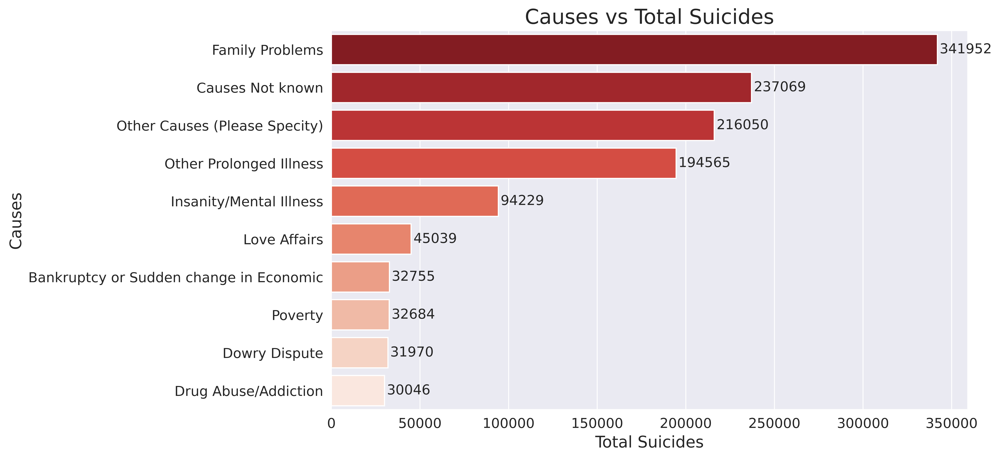

In [ ]:
plt.figure(figsize = (10,6), dpi = 720)
temp = causes[['Type', 'Total']].groupby('Type', as_index = False).sum().sort_values('Total', ascending = False).head(10)
c1 = sns.barplot(y = temp['Type'], x = temp['Total'], palette = 'Reds_r')
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.title('Causes vs Total Suicides', fontsize = 18)
plt.ylabel('Causes', fontsize = 14)
plt.yticks(fontsize = 12)
plt.xlabel('Total Suicides', fontsize = 14)
plt.xticks(fontsize = 12)
plt.show()

In [ ]:
df.groupBy("Type_code","Type").agg(sum('Total').alias('suicides')).show()

+--------------------+--------------------+--------+
|           Type_code|                Type|suicides|
+--------------------+--------------------+--------+
|Professional_Profile|Service (Government)|   23325|
|              Causes|Not having Childr...|    7822|
|       Means_adopted|        By Fire-Arms|    6294|
|       Social_Status|           Seperated|  115413|
|       Means_adopted|By Fire/Self Immo...|  128006|
|       Means_adopted|  By Over Alcoholism|   15973|
|    Education_Status|        No Education|  965271|
|              Causes|        Unemployment|   27365|
|              Causes|Death of Dear Person|   10321|
|              Causes|Ideological Cause...|    2118|
|              Causes|Drug Abuse/Addiction|   30046|
|       Means_adopted|By Consuming Othe...|  231178|
|       Means_adopted|By Overdose of sl...|    9960|
|    Education_Status|Hr. Secondary/Int...|  356724|
|       Means_adopted|By coming under r...|   45299|
|              Causes|Bankruptcy or Sud...|   

In [ ]:
df.groupBy("Gender","Year").agg(sum('Total').alias('suicides')).show()

+------+----+--------+
|Gender|Year|suicides|
+------+----+--------+
|  Male|2011|  789811|
|Female|2010|  426705|
|  Male|2003|  631965|
|Female|2005|  368980|
|Female|2001|  379645|
|Female|2009|  411050|
|  Male|2010|  784617|
|  Male|2012|  778702|
|  Male|2007|  713635|
|  Male|2005|  656221|
|  Male|2008|  724880|
|Female|2006|  381677|
|  Male|2004|  653840|
|Female|2012|  410366|
|Female|2007|  390032|
|Female|2011|  429688|
|Female|2003|  365657|
|  Male|2009|  732983|
|Female|2008|  400202|
|  Male|2002|  623973|
+------+----+--------+
only showing top 20 rows



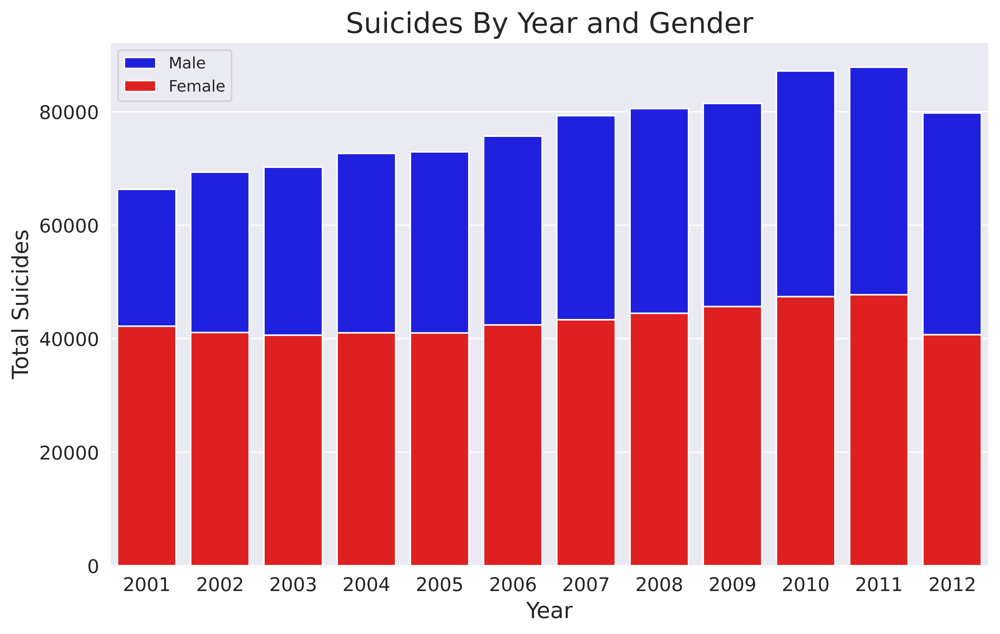

In [ ]:
year = causes.groupby('Year')['Total'].sum().to_frame()

women = causes[causes['Gender'] == 'Female']
women_year = women.groupby('Year')['Total'].sum().to_frame()
women_year.rename(columns = {'Total':'Female'}, inplace = True)

men = causes[causes['Gender'] == 'Male']
men_year = men.groupby('Year')['Total'].sum().to_frame()
men_year.rename(columns = {'Total' : 'Male'}, inplace = True)

gender_year = men_year.join(women_year)
gender_year.reset_index(inplace = True)
plt.figure(figsize = (10,6), dpi = 720)
sns.barplot(x = 'Year', y = 'Male', data = gender_year, color = 'blue', label = 'Male')
sns.barplot(x = 'Year', y = 'Female', data = gender_year, color = 'red', label = 'Female')
plt.title("Suicides By Year and Gender", fontsize = 18)
plt.xlabel("Year", fontsize=14)
plt.xticks(fontsize = 12)
plt.ylabel("Total Suicides", fontsize = 14)
plt.yticks(fontsize = 12)
plt.legend()
plt.show()

**Suicides due to Family problems**

In [ ]:
df.filter(df['Type']=='Family Problems').groupBy("Gender").agg(sum('Total').alias('suicides')).show()

+------+--------+
|Gender|suicides|
+------+--------+
|Female|  133181|
|  Male|  208771|
+------+--------+



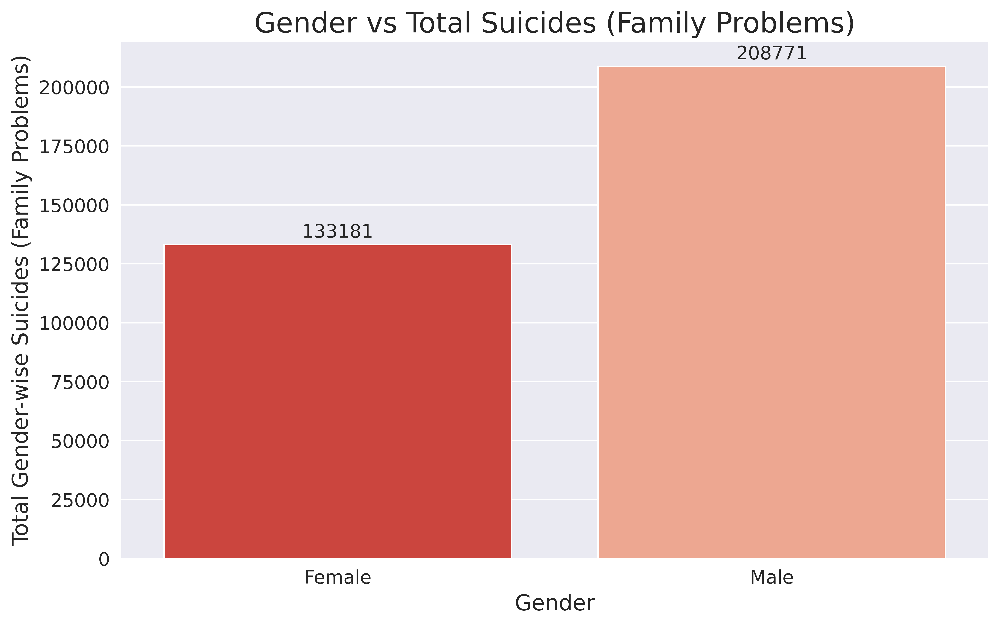

In [ ]:
causes_fp = causes[causes.Type == 'Family Problems']
temp = causes_fp[['Gender', 'Total']].groupby(['Gender']).sum()
plt.figure(figsize = (10,6), dpi = 720)
plt.title('Gender vs Total Suicides (Family Problems)', fontsize = 18)
c1 = sns.barplot(x = temp.index, y = temp.Total, palette = 'Reds_r')
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.xlabel('Gender', fontsize = 14)
plt.xticks(fontsize = 12)
plt.ylabel('Total Gender-wise Suicides (Family Problems)', fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

In [ ]:
df.filter(df['Type']=='Family Problems').groupBy("Age_group").agg(sum('Total').alias('suicides')).show()

+---------+--------+
|Age_group|suicides|
+---------+--------+
|    15-29|  121427|
|      60+|   21671|
|     0-14|    4254|
|    30-44|  125135|
|    45-59|   69465|
+---------+--------+



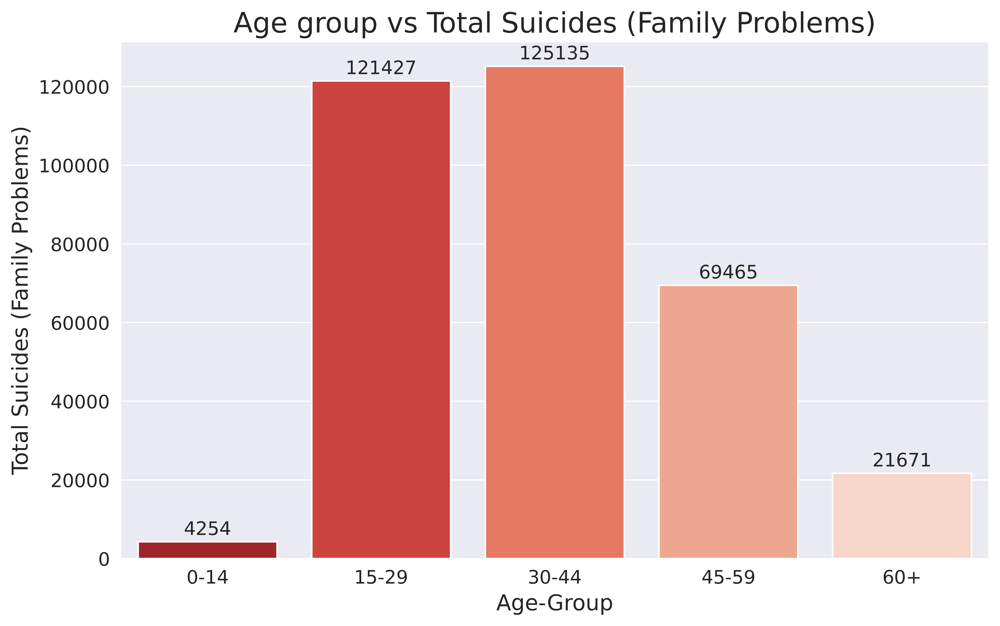

In [ ]:
temp = causes_fp[['Age_group', 'Total']].groupby(['Age_group']).sum()
plt.figure(figsize = (10,6), dpi = 720)
plt.title('Age group vs Total Suicides (Family Problems)', fontsize = 18)
c1 = sns.barplot(x = temp.index, y = temp.Total, palette = 'Reds_r')
c1.bar_label(c1.containers[0],padding = 2, size = 12)
plt.xlabel('Age-Group', fontsize = 14)
plt.xticks(fontsize = 12)
plt.ylabel('Total Suicides (Family Problems)', fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

In [ ]:
df.filter(df['Type']=='Family Problems').groupBy("State").agg(sum('Total').alias('suicides')).show()

+-----------------+--------+
|            State|suicides|
+-----------------+--------+
|        Karnataka|   24042|
|           Kerala|   36327|
|     Chhattisgarh|    8066|
|   Andhra Pradesh|   30696|
|      Lakshadweep|       1|
|   Madhya Pradesh|   18281|
|          Manipur|      26|
|      Daman & Diu|      16|
|  Jammu & Kashmir|     426|
|              Goa|     470|
| Himachal Pradesh|    1144|
|          Haryana|    5045|
|        Jharkhand|    1146|
|Arunachal Pradesh|      96|
|          Gujarat|   13057|
|       Delhi (Ut)|    4105|
|       Chandigarh|     303|
|            Assam|    4312|
|        Meghalaya|     180|
|      Maharashtra|   65341|
+-----------------+--------+
only showing top 20 rows



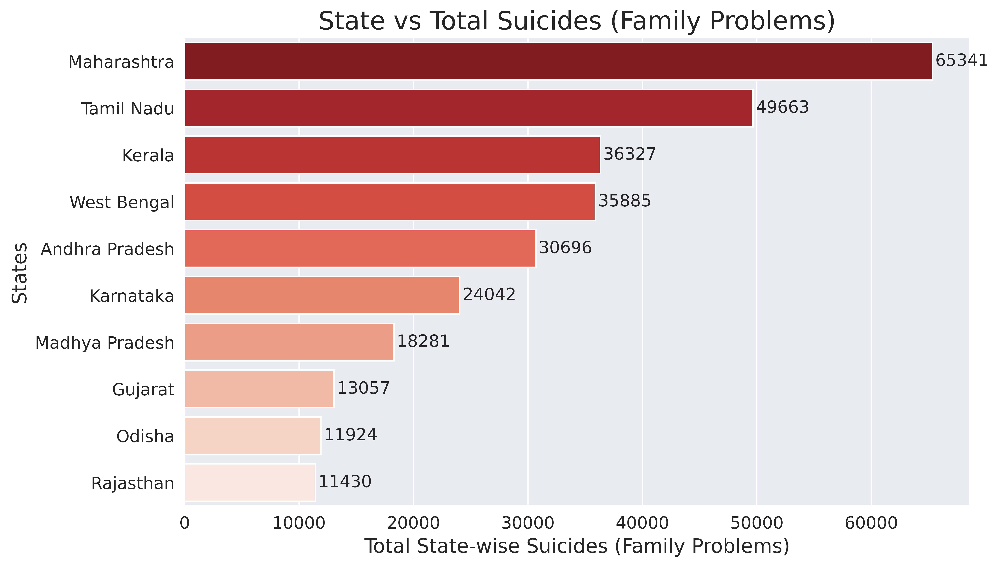

In [ ]:
temp = causes_fp[['State', 'Total']].groupby(['State']).sum().sort_values('Total', ascending=False).head(10)
plt.figure(figsize = (10,6), dpi = 720)
plt.title('State vs Total Suicides (Family Problems)', fontsize = 18)
c1 = sns.barplot(y = temp.index, x = temp.Total, palette = 'Reds_r')
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.ylabel('States', fontsize = 14)
plt.yticks(fontsize = 12)
plt.xlabel('Total State-wise Suicides (Family Problems)', fontsize = 14)
plt.xticks(fontsize = 12)
plt.show()

**Suicides due to Mental illness**

In [ ]:
df.filter(df['Type']=='Insanity/Mental Illness').groupBy("Gender").agg(sum('Total').alias('suicides')).show()

+------+--------+
|Gender|suicides|
+------+--------+
|Female|   33352|
|  Male|   60877|
+------+--------+



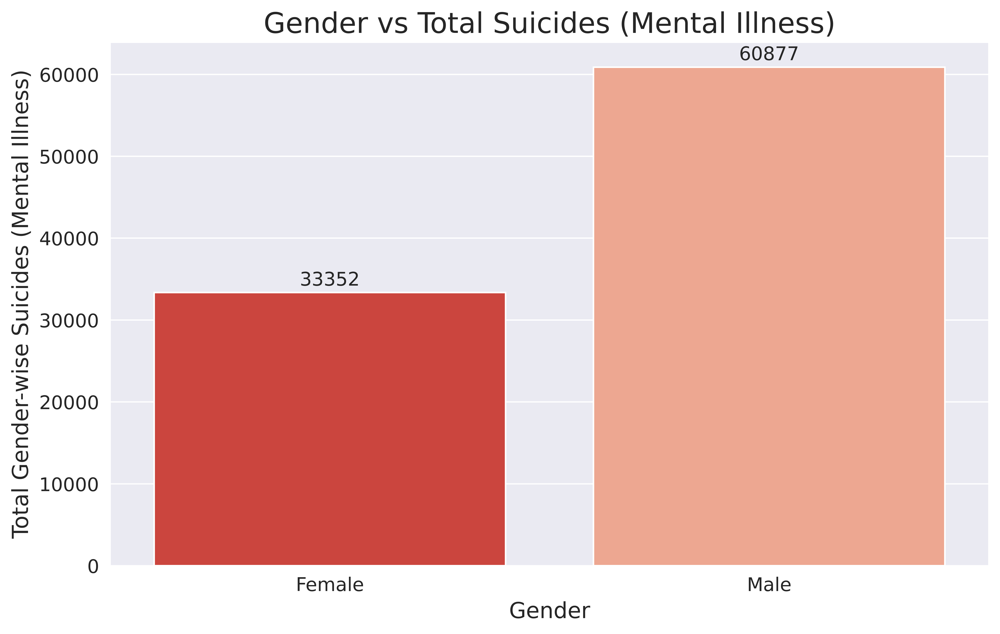

In [ ]:
causes_mi = causes[causes.Type == 'Insanity/Mental Illness']
temp = causes_mi[['Gender','Total']].groupby(['Gender']).sum()
plt.figure(figsize = (10,6), dpi = 720)
plt.title('Gender vs Total Suicides (Mental Illness)',fontsize = 18)
c1 = sns.barplot(x = temp.index, y = temp.Total, palette = "Reds_r")
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.xlabel('Gender', fontsize = 14)
plt.xticks(fontsize = 12)
plt.ylabel('Total Gender-wise Suicides (Mental Illness)', fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

In [ ]:
df.filter(df['Type']=='Insanity/Mental Illness').groupBy("Age_group").agg(sum('Total').alias('suicides')).show()

+---------+--------+
|Age_group|suicides|
+---------+--------+
|    15-29|   27259|
|      60+|   10493|
|     0-14|    1223|
|    30-44|   32506|
|    45-59|   22748|
+---------+--------+



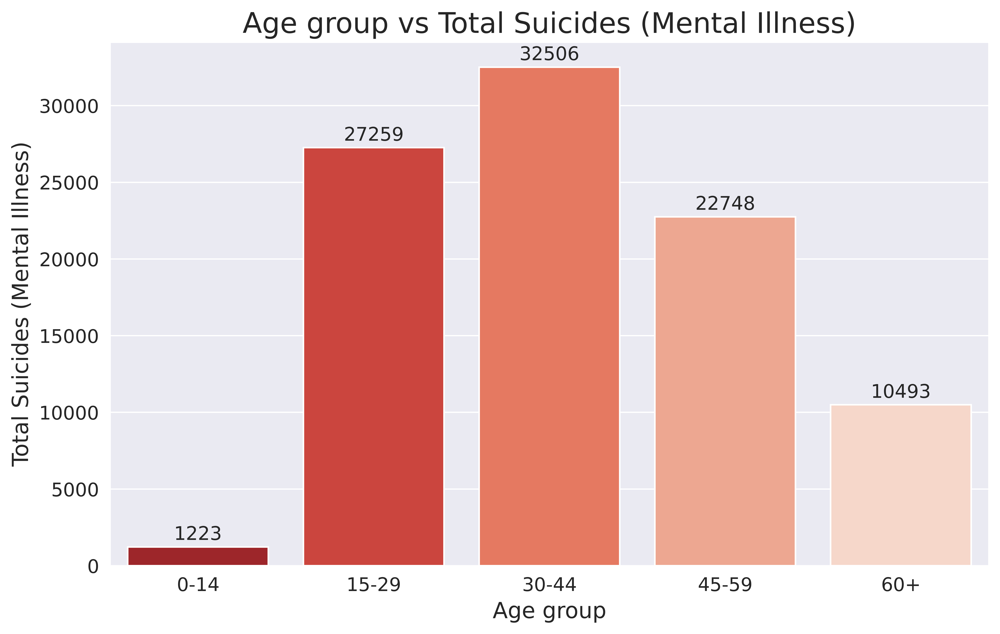

In [ ]:
temp = causes_mi[['Age_group','Total']].groupby(['Age_group']).sum()
plt.figure(figsize = (10,6), dpi = 720)
c1= sns.barplot(x = temp.index, y = temp.Total, palette = "Reds_r")
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.title('Age group vs Total Suicides (Mental Illness)',fontsize = 18)
plt.xlabel('Age group', fontsize = 14)
plt.xticks(fontsize = 12)
plt.ylabel('Total Suicides (Mental Illness)', fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

In [ ]:
df.filter(df['Type']=='Insanity/Mental Illness').groupBy("State").agg(sum('Total').alias('suicides')).show()

+-----------------+--------+
|            State|suicides|
+-----------------+--------+
|        Karnataka|    7325|
|           Kerala|   15276|
|     Chhattisgarh|    2972|
|   Andhra Pradesh|   10521|
|      Lakshadweep|       3|
|   Madhya Pradesh|    4670|
|          Manipur|       0|
|      Daman & Diu|      17|
|  Jammu & Kashmir|      34|
|              Goa|     602|
| Himachal Pradesh|     377|
|          Haryana|    1327|
|        Jharkhand|     426|
|Arunachal Pradesh|      20|
|          Gujarat|    6761|
|       Delhi (Ut)|     308|
|       Chandigarh|      40|
|            Assam|     513|
|        Meghalaya|      48|
|      Maharashtra|   14859|
+-----------------+--------+
only showing top 20 rows



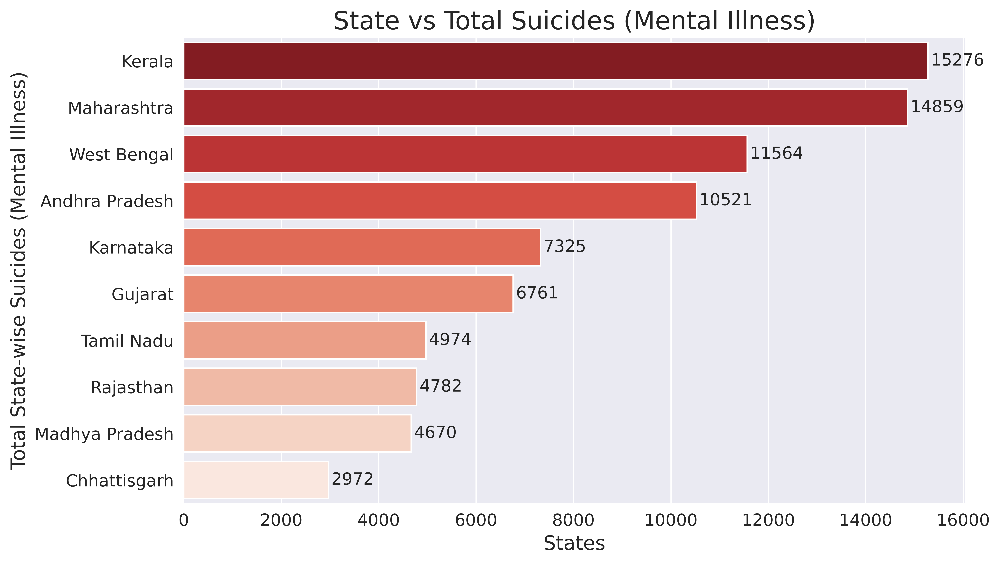

In [ ]:
temp = causes_mi[['State','Total']].groupby(['State']).sum().sort_values('Total',ascending = False).head(10)
plt.figure(figsize = (10,6), dpi = 720)
plt.title('State vs Total Suicides (Mental Illness)', fontsize = 18)
c1 = sns.barplot(y = temp.index, x = temp.Total, palette = "Reds_r")
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.xlabel('States', fontsize = 14)
plt.xticks(fontsize = 12)
plt.ylabel('Total State-wise Suicides (Mental Illness)', fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

**Suicides due to Love Affairs**

In [ ]:
df.filter(df['Type']=='Love Affairs').groupBy("Gender").agg(sum('Total').alias('suicides')).show()

+------+--------+
|Gender|suicides|
+------+--------+
|Female|   21339|
|  Male|   23700|
+------+--------+



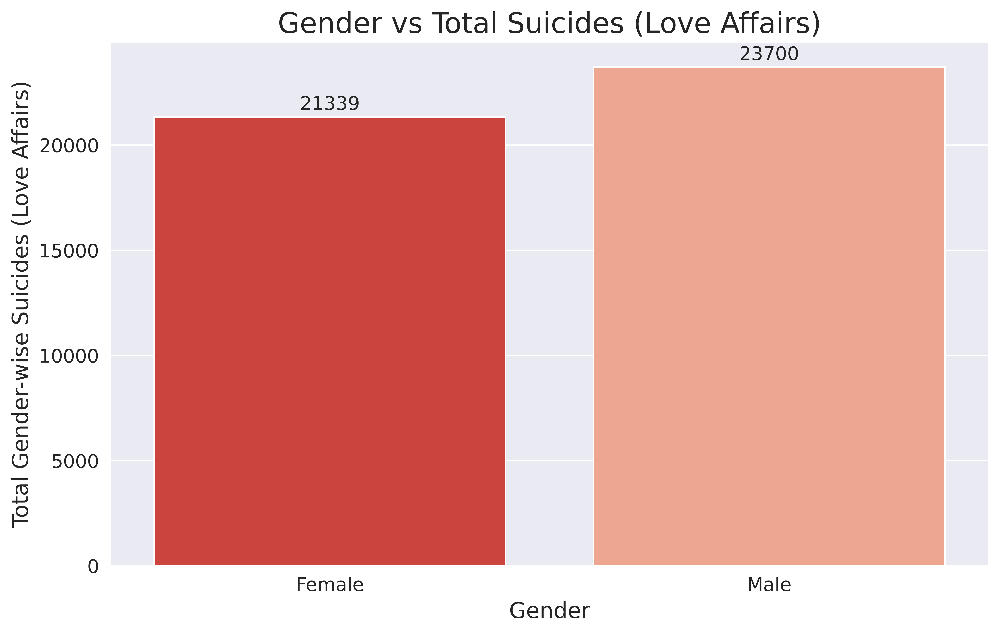

In [ ]:
causes_la = causes[causes.Type == 'Love Affairs']
temp = causes_la[['Gender','Total']].groupby(['Gender']).sum()
plt.figure(figsize = (10,6), dpi = 720)
plt.title('Gender vs Total Suicides (Love Affairs)',fontsize = 18)
c1 = sns.barplot(x = temp.index, y = temp.Total, palette = "Reds_r")
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.xlabel('Gender', fontsize = 14)
plt.xticks(fontsize = 12)
plt.ylabel('Total Gender-wise Suicides (Love Affairs)', fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

In [ ]:
df.filter(df['Type']=='Love Affairs').groupBy("Age_group").agg(sum('Total').alias('suicides')).show()

+---------+--------+
|Age_group|suicides|
+---------+--------+
|    15-29|   33023|
|      60+|      38|
|     0-14|    1250|
|    30-44|    9866|
|    45-59|     862|
+---------+--------+



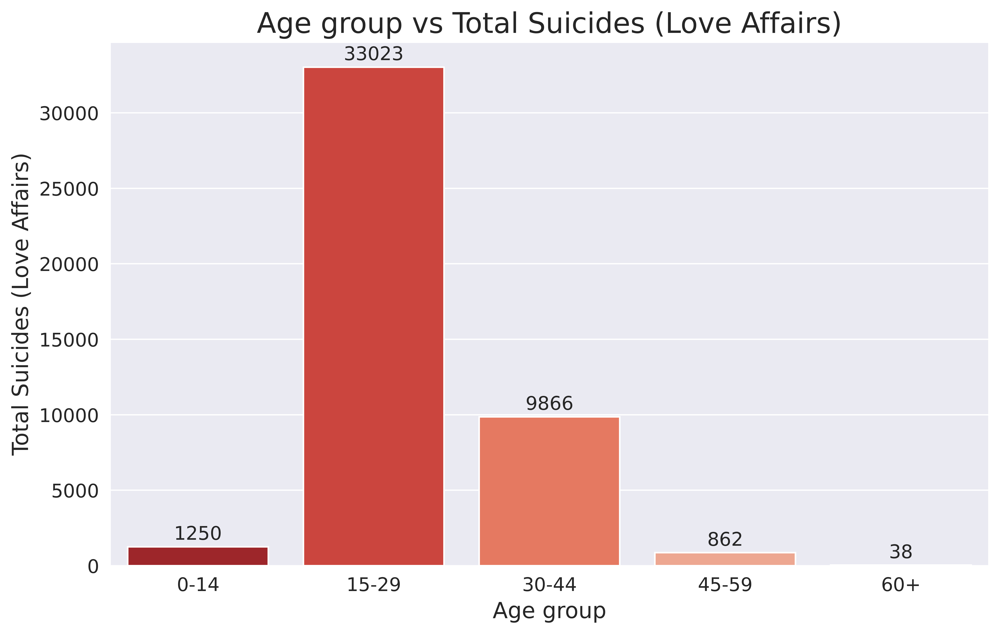

In [ ]:
temp = causes_la[['Age_group','Total']].groupby(['Age_group']).sum()
plt.figure(figsize = (10,6), dpi = 720)
c1= sns.barplot(x = temp.index, y = temp.Total, palette = "Reds_r")
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.title('Age group vs Total Suicides (Love Affairs)',fontsize = 18)
plt.xlabel('Age group', fontsize = 14)
plt.xticks(fontsize = 12)
plt.ylabel('Total Suicides (Love Affairs)', fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

In [ ]:
df.filter(df['Type']=='Love Affairs').groupBy("State").agg(sum('Total').alias('suicides')).show()

+-----------------+--------+
|            State|suicides|
+-----------------+--------+
|        Karnataka|    1701|
|           Kerala|    1223|
|     Chhattisgarh|    1306|
|   Andhra Pradesh|    3325|
|      Lakshadweep|       0|
|   Madhya Pradesh|    2303|
|          Manipur|      19|
|      Daman & Diu|      12|
|  Jammu & Kashmir|     121|
|              Goa|     194|
| Himachal Pradesh|     216|
|          Haryana|     429|
|        Jharkhand|     408|
|Arunachal Pradesh|      27|
|          Gujarat|    2318|
|       Delhi (Ut)|     584|
|       Chandigarh|      41|
|            Assam|    4852|
|        Meghalaya|      47|
|      Maharashtra|    2872|
+-----------------+--------+
only showing top 20 rows



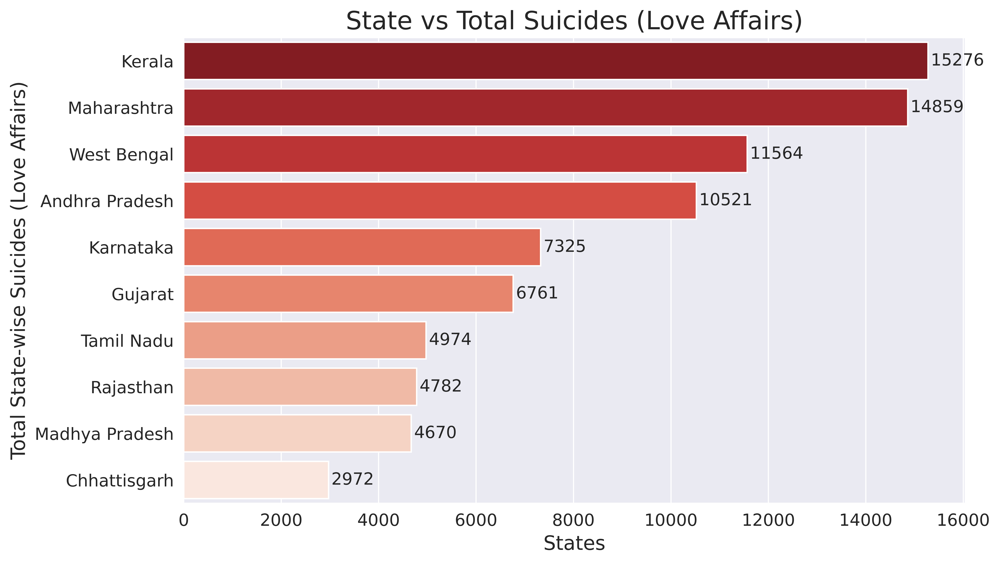

In [ ]:
temp = causes_mi[['State','Total']].groupby(['State']).sum().sort_values('Total',ascending=False).head(10)
plt.figure(figsize = (10,6), dpi = 720)
plt.title('State vs Total Suicides (Love Affairs)',fontsize = 18)
c1 = sns.barplot(y = temp.index, x = temp.Total, palette = "Reds_r")
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.xlabel('States', fontsize = 14)
plt.xticks(fontsize = 12)
plt.ylabel('Total State-wise Suicides (Love Affairs)', fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

**Suicides due to Bankruptcy**

In [ ]:
df.filter(df['Type']=='Bankruptcy or Sudden change in Economic').groupBy("Gender").agg(sum('Total').alias('suicides')).show()

+------+--------+
|Gender|suicides|
+------+--------+
|Female|    3877|
|  Male|   28878|
+------+--------+



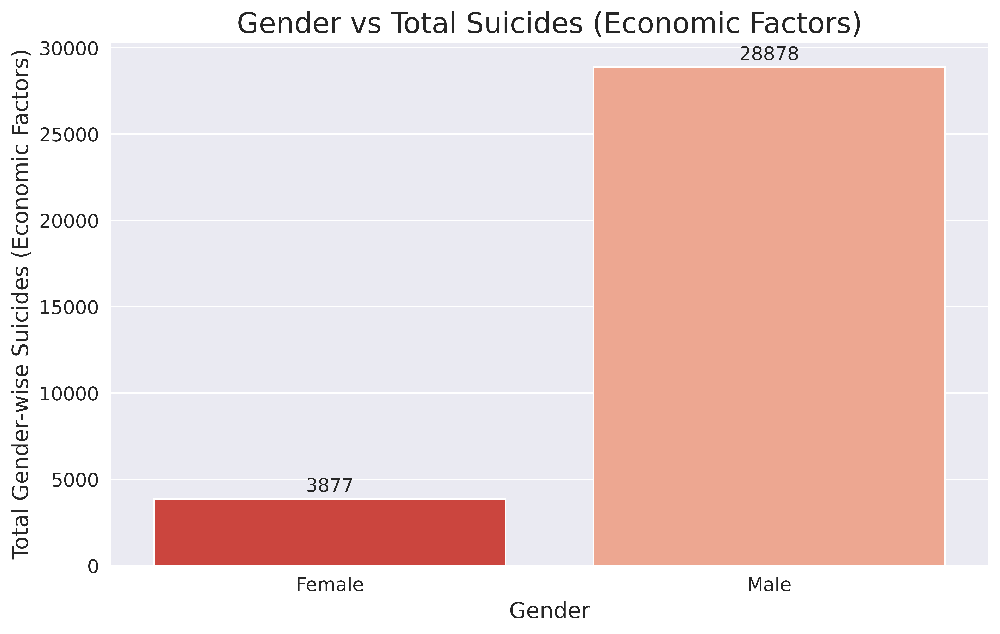

In [ ]:
causes_bank = causes[causes.Type == 'Bankruptcy or Sudden change in Economic']
temp = causes_bank[['Gender','Total']].groupby(['Gender']).sum()
plt.figure(figsize = (10,6), dpi = 720)
plt.title('Gender vs Total Suicides (Economic Factors)',fontsize = 18)
c1 = sns.barplot(x = temp.index, y = temp.Total, palette = "Reds_r")
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.xlabel('Gender', fontsize = 14)
plt.xticks(fontsize = 12)
plt.ylabel('Total Gender-wise Suicides (Economic Factors)', fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

In [ ]:
df.filter(df['Type']=='Bankruptcy or Sudden change in Economic').groupBy("Age_group").agg(sum('Total').alias('suicides')).show()

+---------+--------+
|Age_group|suicides|
+---------+--------+
|    15-29|    5796|
|      60+|    2849|
|     0-14|     107|
|    30-44|   13582|
|    45-59|   10421|
+---------+--------+



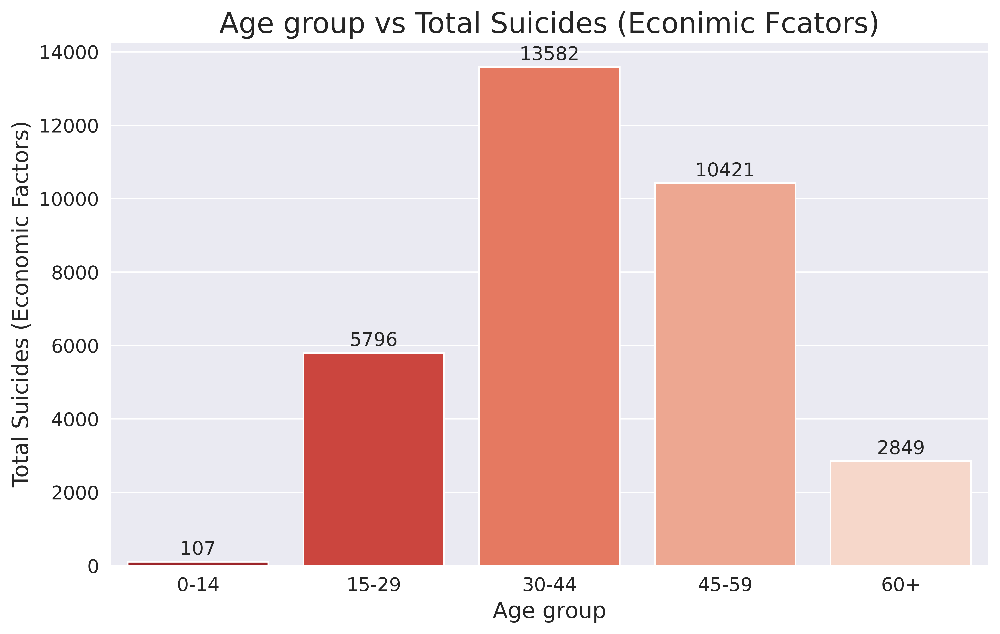

In [ ]:
temp = causes_bank[['Age_group','Total']].groupby(['Age_group']).sum()
plt.figure(figsize = (10,6), dpi = 720)
c1= sns.barplot(x = temp.index, y = temp.Total, palette = "Reds_r")
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.title('Age group vs Total Suicides (Econimic Fcators)',fontsize = 18)
plt.xlabel('Age group', fontsize = 14)
plt.xticks(fontsize = 12)
plt.ylabel('Total Suicides (Economic Factors)', fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

In [ ]:
df.filter(df['Type']=='Bankruptcy or Sudden change in Economic').groupBy("State").agg(sum('Total').alias('suicides')).show()

+-----------------+--------+
|            State|suicides|
+-----------------+--------+
|        Karnataka|    2286|
|           Kerala|    7827|
|     Chhattisgarh|     449|
|   Andhra Pradesh|    8112|
|      Lakshadweep|       0|
|   Madhya Pradesh|     802|
|          Manipur|       0|
|      Daman & Diu|       0|
|  Jammu & Kashmir|      48|
|              Goa|      58|
| Himachal Pradesh|      21|
|          Haryana|     147|
|        Jharkhand|     246|
|Arunachal Pradesh|       8|
|          Gujarat|    1509|
|       Delhi (Ut)|     223|
|       Chandigarh|       9|
|            Assam|      99|
|        Meghalaya|       3|
|      Maharashtra|    6732|
+-----------------+--------+
only showing top 20 rows



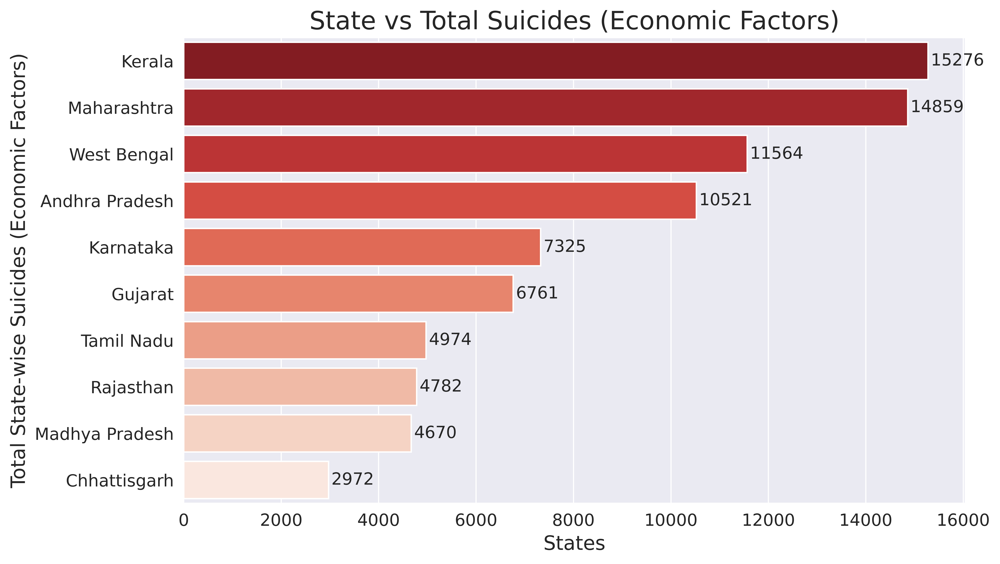

In [ ]:
temp = causes_mi[['State','Total']].groupby(['State']).sum().sort_values('Total',ascending=False).head(10)
plt.figure(figsize = (10,6), dpi = 720)
plt.title('State vs Total Suicides (Economic Factors)',fontsize = 18)
c1 = sns.barplot(y = temp.index, x = temp.Total, palette = "Reds_r")
c1.bar_label(c1.containers[0], padding = 2, size = 12)
plt.xlabel('States', fontsize = 14)
plt.xticks(fontsize = 12)
plt.ylabel('Total State-wise Suicides (Economic Factors)', fontsize = 14)
plt.yticks(fontsize = 12)
plt.show()

**Encoding**

In [ ]:
display(data.dtypes)

State        object
Year          int64
Type_code    object
Type         object
Gender       object
Age_group    object
Total         int64
dtype: object

In [ ]:
cat_cols = [col for col in data.columns if data[col].dtype == 'object']

In [ ]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for col in cat_cols:
    data[col] = le.fit_transform(data[col])
data.head()

,State,Year,Type_code,Type,Gender,Age_group,Total
0,0,2001,0,37,0,1,0
1,0,2001,0,0,0,1,0
2,0,2001,0,19,0,1,0
3,0,2001,0,51,0,1,0
4,0,2001,0,26,0,1,0


In [ ]:
display(data.dtypes)

State        int64
Year         int64
Type_code    int64
Type         int64
Gender       int64
Age_group    int64
Total        int64
dtype: object

In [ ]:
print(data)

        State  Year  Type_code  Type  Gender  Age_group  Total
0           0  2001          0    37       0          1      0
1           0  2001          0     0       0          1      0
2           0  2001          0    19       0          1      0
3           0  2001          0    51       0          1      0
4           0  2001          0    26       0          1      0
...       ...   ...        ...   ...     ...        ...    ...
237514     37  2012          4    61       1          0    149
237515     37  2012          4    68       1          0    233
237516     37  2012          4    40       1          0   5451
237517     37  2012          4    25       1          0    189
237518     37  2012          4    43       1          0   2658

[237519 rows x 7 columns]


In [ ]:
X=data.drop(['Total'],axis=1)
Y=data['Total']
from sklearn.model_selection import train_test_split
X_test,X_train,Y_test,Y_train=train_test_split(X,Y,test_size=0.3,random_state=1)

In [ ]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
X_train=ss.fit_transform(X_train)
X_test=ss.transform(X_test)

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
dec_tree_cls=DecisionTreeClassifier()
dec_tree_cls.fit(X_train,Y_train)
y_pred_dec=dec_tree_cls.predict(X_test)
print("Decision Tree Accuracy ",dec_tree_cls.score(X_test,Y_test))

Decision Tree Accuracy  0.5109435051695206


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

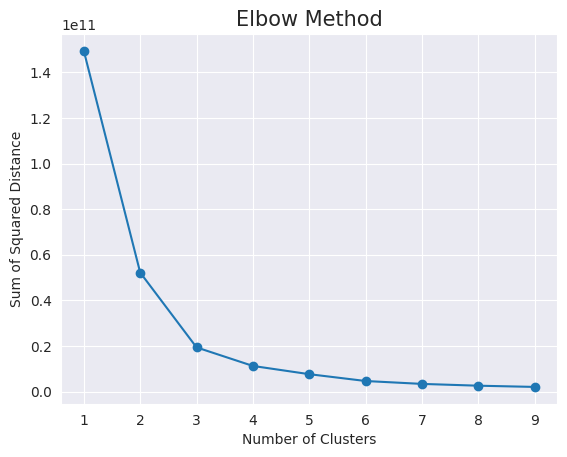

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
a=[]
K=range(1,10)
for i in K:
    model = KMeans(n_clusters=i)
    model.fit(data)
    a.append(model.inertia_)

plt.plot(K,a,marker='o')
plt.title('Elbow Method',fontsize=15)
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Distance')
plt.show()

In [ ]:
data.groupby(['State','Year','Gender'])[['Total']].sum()

Total
State Year Gender       
0     2001 0         250
           1         395
      2002 0         265
           1         455
      2003 0         215
...                  ...
37    2010 1       46505
      2011 0       34340
           1       48120
      2012 0       18831
           1       26040

[912 rows x 1 columns]

In [ ]:
D = data.groupby('Year').Total.sum()
D

Year
2001     976464
2002     993648
2003     997622
2004    1023137
2005    1025201
2006    1062991
2007    1103667
2008    1125082
2009    1144033
2010    1211322
2011    1219499
2012    1189068
Name: Total, dtype: int64

In [ ]:
X = D.index.values.reshape(-1,1)
y = D.values

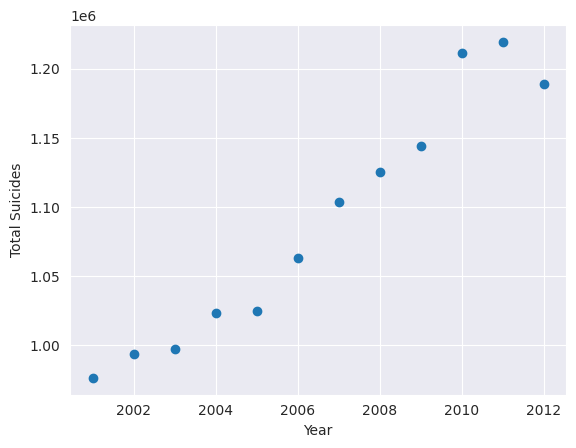

In [ ]:
plt.scatter(X,y)
plt.xlabel('Year')
plt.ylabel('Total Suicides')
plt.show()

In [ ]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression()
reg.fit(X,y)

LinearRegression()

In [ ]:
reg.coef_

array([23818.18881119])

In [ ]:
reg.intercept_

-46701884.682983674

In [ ]:
Yp = reg.predict(X)
Yp

array([ 958311.12820512,  982129.31701631, 1005947.5058275 ,
       1029765.69463869, 1053583.88344987, 1077402.07226107,
       1101220.26107226, 1125038.44988345, 1148856.63869463,
       1172674.82750582, 1196493.01631701, 1220311.2051282 ])

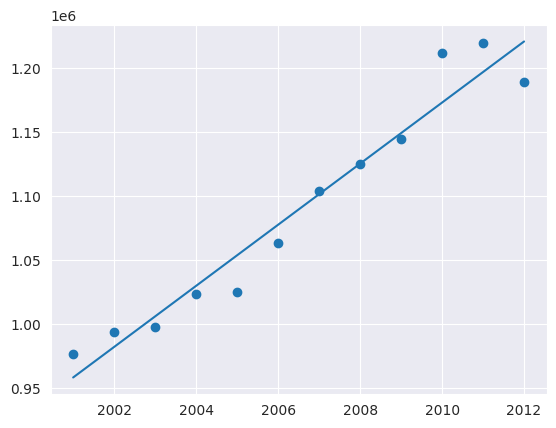

In [ ]:
plt.scatter(X,y)
plt.plot(X,Yp)
plt.show()

In [ ]:
reg.score(X,y) * 100

94.61522633937145

In [ ]:
reg.predict([[2020]])

array([1410856.71561771])

In [ ]:
data1 = pd.read_csv("/content/drive/MyDrive/Suicides in India 2001-2012.csv")

In [ ]:
cause=data1[data1['Type_code']=='Causes'].reset_index(drop=True)
cause=cause.drop("Type_code", axis=1)
print(cause)

                State  Year                                      Type  Gender  \
0       A & N Islands  2001                        Illness (Aids/STD)  Female   
1       A & N Islands  2001   Bankruptcy or Sudden change in Economic  Female   
2       A & N Islands  2001   Cancellation/Non-Settlement of Marriage  Female   
3       A & N Islands  2001         Physical Abuse (Rape/Incest Etc.)  Female   
4       A & N Islands  2001                             Dowry Dispute  Female   
...               ...   ...                                       ...     ...   
109195    West Bengal  2012                      Drug Abuse/Addiction    Male   
109196    West Bengal  2012  Not having Children(Barrenness/Impotency    Male   
109197    West Bengal  2012                                   Poverty    Male   
109198    West Bengal  2012                           Family Problems    Male   
109199    West Bengal  2012                   Insanity/Mental Illness    Male   

       Age_group  Total  
0

In [ ]:
from sklearn.preprocessing import LabelEncoder

lb_make=LabelEncoder()

cause["Type"]=lb_make.fit_transform(cause["Type"])

In [ ]:
cause['Gender']=cause['Gender'].replace("Female",0)
cause['Gender']=cause['Gender'].replace("Male",1)

In [ ]:
dummies = pd.get_dummies(cause[['Age_group']])
cause_dummy= pd.concat([cause.drop(['Age_group'],axis=1), dummies],axis=1)
cause=cause_dummy

In [ ]:
cause.replace([2001,2002,2003], 0, inplace=True)
cause.replace([2004,2005], 1, inplace=True)
cause.replace([2006,2012], 2, inplace=True)
cause.replace([2007,2008], 3, inplace=True)
cause.replace(2009, 4, inplace=True)
cause.replace([2010,2011], 5, inplace=True)

In [ ]:
cause.replace(['A & N Islands','Arunachal Pradesh','Chandigarh','D & N Haveli','Daman & Diu','Goa','Himachal Pradesh','Jammu & Kashmir','Lakshadweep','Manipur', 'Meghalaya', 'Mizoram', 'Nagaland', 'Sikkim','Uttarakhand'],1,inplace=True)
cause.replace(['Bihar','Jharkhand','Puducherry','Punjab','Tripura'],2, inplace=True)
cause.replace(['Delhi (Ut)'],3,inplace=True)
cause.replace(['Assam','Haryana'],4,inplace=True)
cause.replace(['Odisha', 'Rajasthan','Uttar Pradesh'],5,inplace=True)
cause.replace(['Chhattisgarh','Gujarat'],6,inplace=True)
cause.replace(['Madhya Pradesh'],7,inplace=True)
cause.replace(['Kerala'],8,inplace=True)
cause.replace(['Andhra Pradesh','Tamil Nadu', 'West Bengal'],10,inplace=True)
cause.replace(["Karnataka"],9,inplace=True)
cause.replace(["Maharashtra"],10,inplace=True)
cause

,State,Year,Type,Gender,Total,Age_group_0-14,Age_group_15-29,Age_group_30-44,Age_group_45-59,Age_group_60+
0,1,0,14,0,0,1,0,0,0,0
1,1,0,0,0,0,1,0,0,0,0
2,1,0,2,0,0,1,0,0,0,0
3,1,0,22,0,0,1,0,0,0,0
4,1,0,7,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
109195,10,2,8,1,0,0,0,0,0,1
109196,10,2,18,1,0,0,0,0,0,1
109197,10,2,23,1,0,0,0,0,0,1
109198,10,2,11,1,0,0,0,0,0,1


In [ ]:
import statsmodels.api as sm

col=["State", "Year", "Gender", "Type",'Age_group_0-14', 'Age_group_15-29', 'Age_group_30-44', 	'Age_group_45-59', 'Age_group_60+']
print(col)
mod=sm.OLS(cause['Total'], cause[col])

re=mod.fit()

print(re.summary())

['State', 'Year', 'Gender', 'Type', 'Age_group_0-14', 'Age_group_15-29', 'Age_group_30-44', 'Age_group_45-59', 'Age_group_60+']
                            OLS Regression Results                            
Dep. Variable:                  Total   R-squared:                       0.113
Model:                            OLS   Adj. R-squared:                  0.113
Method:                 Least Squares   F-statistic:                     1744.
Date:                Wed, 12 Jul 2023   Prob (F-statistic):               0.00
Time:                        20:23:11   Log-Likelihood:            -5.9583e+05
No. Observations:              109200   AIC:                         1.192e+06
Df Residuals:                  109191   BIC:                         1.192e+06
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975

In [ ]:
from sklearn import metrics as sm

y=cause["Total"]
x=cause[col]
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test=train_test_split(x,y,test_size=0.25,random_state=56)

reg=LinearRegression()
reg.fit(X_train, y_train)
pred=reg.predict(X_test)
predict=pd.DataFrame(pred)

print(reg.score(X_test, y_test))
print("Mean absolute error =", round(sm.mean_absolute_error(y_test, predict), 2))
print("Mean squared error =", round(sm.mean_squared_error(y_test, predict), 2))
print("R2 score =", round(sm.r2_score(y_test, predict), 2))

0.11069776391745145
Mean absolute error = 21.85
Mean squared error = 3006.74
R2 score = 0.11


Linear Regression Feature: 0, Score: 5.67040
Linear Regression Feature: 1, Score: 0.57915
Linear Regression Feature: 2, Score: 7.78682
Linear Regression Feature: 3, Score: -0.12106
Linear Regression Feature: 4, Score: -11.81647
Linear Regression Feature: 5, Score: 10.05799
Linear Regression Feature: 6, Score: 9.42812
Linear Regression Feature: 7, Score: 0.35874
Linear Regression Feature: 8, Score: -8.02838


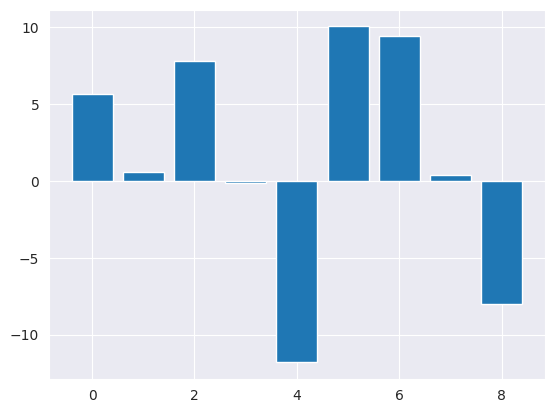

In [ ]:
importance = reg.coef_
# summarize feature importance
for i,v in enumerate(importance):
	print('Linear Regression Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor


tree=DecisionTreeRegressor(max_depth=11, random_state=1)
bag=BaggingRegressor(base_estimator=tree, n_estimators=100, random_state=1)

tree.fit(X_train, y_train)
print("Accuracy of DecisionTree regressor",tree.score(X_test, y_test))

bag.fit(X_train, y_train)

print("Accuracy of bagging regressor", bag.score(X_test, y_test))

Accuracy of DecisionTree regressor 0.7536485738162948


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Accuracy of bagging regressor 0.7753074151196868


Decision Tree Feature: 0, Score: 0.18460
Decision Tree Feature: 1, Score: 0.00774
Decision Tree Feature: 2, Score: 0.06767
Decision Tree Feature: 3, Score: 0.60351
Decision Tree Feature: 4, Score: 0.03069
Decision Tree Feature: 5, Score: 0.02125
Decision Tree Feature: 6, Score: 0.00872
Decision Tree Feature: 7, Score: 0.03411
Decision Tree Feature: 8, Score: 0.04172


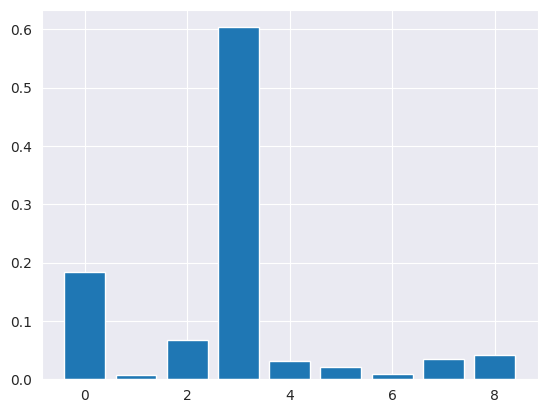

In [ ]:
importance = tree.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Decision Tree Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()